<img style="float: left;" src="https://raw.githubusercontent.com/ProjectPythiaCookbooks/radar-cookbook/main/thumbnail.png" width=500>

In [39]:
import pyart
import act
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import glob

import xradar as xd
import cmweather
from open_radar_data import DATASETS

In [40]:
# Set the datastream and start/enddates
# Set your username and token here!
username = 'ecwolff'
token = 

datastream = 'corcsapr2cmacppiM1.c1'
startdate = '2019-01-29T18:00:00'
enddate = '2019-01-29T20:00:00'

# Use ACT to easily download the data.  Watch for the data citation!  Show some support
# for ARM's instrument experts and cite their data if you use it in a publication
result = act.discovery.download_arm_data(username, token, datastream, startdate, enddate)

[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.194503.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.180003.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.183003.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.181503.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.190006.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.193003.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.191503.nc
[DOWNLOADING] corcsapr2cmacppiM1.c1.20190129.184503.nc

If you use these data to prepare a publication, please cite:

Collis, S., & Giangrande, S. Corrected Moments in Antenna Coordinates, Version 2
(CSAPR2CMACPPI). Atmospheric Radiation Measurement (ARM) User Facility.
https://doi.org/10.5439/1668872



In [41]:
files = sorted(glob.glob('corcsapr2cmacppiM1.c1/*'))
files

['corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.180003.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.181503.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.183003.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.184503.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.190006.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.191503.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.193003.nc',
 'corcsapr2cmacppiM1.c1/corcsapr2cmacppiM1.c1.20190129.194503.nc']

In [49]:
radar = xd.io.open_cfradial1_datatree(files[2], first_dim="auto")
#display(radar)

In [50]:
radar = radar.xradar.georeference()
display(radar)

DataTree('root', parent=None)
│   Dimensions:              (sweep: 15)
│   Dimensions without coordinates: sweep
│   Data variables:
│       sweep_group_name     (sweep) <U10 600B 'sweep_0.0' ... 'sweep_14.0'
│       sweep_fixed_angle    (sweep) float32 60B ...
│       latitude             float32 4B ...
│       longitude            float32 4B ...
│       altitude             float32 4B ...
│       time_coverage_start  |S32 32B ...
│       time_coverage_end    |S32 32B ...
│       volume_number        int32 4B ...
│   Attributes:
│       version:      2.0 lite
│       history:      created by zsherman on or-condo-c215.ornl.gov at 2020-10-01...
│       references:   See CSAPR2 Instrument Handbook
│       institution:  United States Department of Energy - Atmospheric Radiation ...
│       source:       Atmospheric Radiation Measurement (ARM) program C-band Scan...
│       Conventions:  CF/Radial instrument_parameters ARM-1.3
│       comment:      This is highly experimental and initial data. There are man...
├── DataTree('radar_parameters')
├── DataTree('georeferencing_correction')
├── DataTree('sweep_0')
│       Dimensions:                                                (azimuth: 361,
│                                                                   range: 1100)
│       Coordinates:
│           time                                                   (azimuth) datetime64[ns] 3kB ...
│         * range                                                  (range) float32 4kB ...
│           elevation                                              (azimuth) float32 1kB ...
│         * azimuth                                                (azimuth) float32 1kB ...
│           latitude                                               float32 4B -32.13
│           longitude                                              float32 4B -64.73
│           altitude                                               float32 4B 1.141e+03
│           crs_wkt                                                int64 8B 0
│           x                                                      (azimuth, range) float32 2MB ...
│           y                                                      (azimuth, range) float32 2MB ...
│           z                                                      (azimuth, range) float32 2MB ...
│       Data variables: (12/61)
│           attenuation_corrected_differential_reflectivity        (azimuth, range) float32 2MB ...
│           attenuation_corrected_differential_reflectivity_lag_1  (azimuth, range) float32 2MB ...
│           attenuation_corrected_reflectivity_h                   (azimuth, range) float32 2MB ...
│           censor_mask                                            (azimuth, range) int32 2MB ...
│           classification_mask                                    (azimuth, range) int32 2MB ...
│           copol_correlation_coeff                                (azimuth, range) float32 2MB ...
│           ...                                                     ...
│           rain_rate_A                                            (azimuth, range) float64 3MB ...
│           sweep_number                                           float64 8B ...
│           sweep_fixed_angle                                      float32 4B ...
│           sweep_mode                                             <U6 24B 'sector'
│           prt                                                    (azimuth) float32 1kB ...
│           nyquist_velocity                                       (azimuth) float32 1kB ...
├── DataTree('sweep_1')
│       Dimensions:                                                (azimuth: 361,
│                                                                   range: 1100)
│       Coordinates:
│           time                                                   (azimuth) datetime64[ns] 3kB ...
│         * range                                                  (range) float32 4kB ...
│           elevation                            

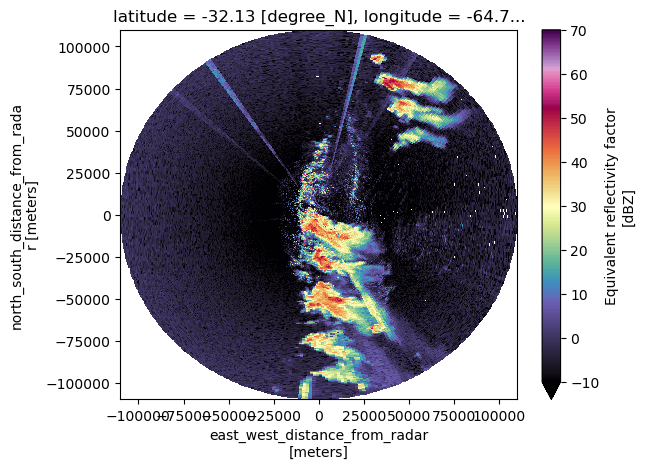

In [51]:
radar["sweep_0"]["reflectivity"].plot(x="x", y="y", cmap="ChaseSpectral", vmin=-10, vmax=70)

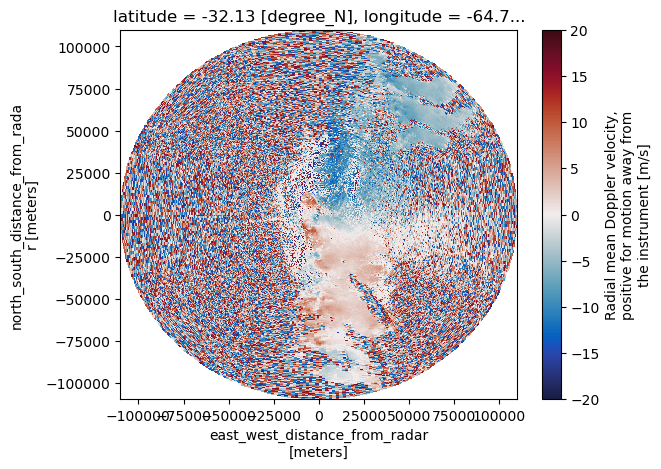

In [52]:
radar['sweep_0']["mean_doppler_velocity"].plot(x="x", y="y", cmap="balance", vmin=-20, vmax=20)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
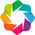

In [46]:
import hvplot.xarray
import holoviews as hv
hv.extension('bokeh')

In [60]:
vel_plot = radar['sweep_0']["mean_doppler_velocity"].hvplot.quadmesh(x="x", y="y", cmap="balance", 
                                                          height=400, width=500, 
                                                          clim=(-20, 20),
                                                          rasterize=True)

In [61]:
ref_plot = radar['sweep_0']["reflectivity"].hvplot.quadmesh(x="x", y="y", cmap="ChaseSpectral", 
                                                          height=400, width=500, 
                                                          clim=(-20, 70),
                                                          rasterize=True)

In [62]:
ref_plot+vel_plot

:Layout
   .DynamicMap.I  :DynamicMap   []
      :Image   [x,y]   (reflectivity)
   .DynamicMap.II :DynamicMap   []
      :Image   [x,y]   (mean_doppler_velocity)

In [ ]:
# Add slider for time or scan elevation